In [2]:
import pickle
from collections import namedtuple
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import os
import cv2
from REACTRL import Episode_Memory, Createc_Controller, sac_agent, ReplayMemory, HerReplayMemory
# from REACTRL import plot_graph, show_reset, show_done, show_step, image_detect_edges, image_detect_blobs, image_select_points, detect_indiv_mols, detect_indiv_mol_center
from REACTRL    import mol_property
import numpy as np
import shutil
import pandas as pd

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.distributions import Normal
# dissociate_data = namedtuple('dissociate_data',['time','x','y','current','dI_dV','topography'])


from REACTRL.task_script.utils import *

total_output_folder = 'all_output'
task_folder_prefix = 'vertmani'
save_scan_img_large_prefix = 'scan_img_large'
save_scan_img_before_prefix = 'scan_img_before'
save_scan_img_after_prefix = 'scan_img_after'
save_scan_data_large_prefix = 'scan_data_large'
save_scan_data_before_prefix = 'scan_data_before'
save_scan_data_after_prefix = 'scan_data_after'
save_vert_data_prefix = 'vert_data'
save_vert_tip_pos_prefix = 'vert_tip_pos'

current_time = '5_26_10_51' 

task_folder='%s/%s_%s' % (total_output_folder, task_folder_prefix, current_time)
save_img_large='%s/%s_%s' % (task_folder, save_scan_img_large_prefix, current_time)
save_img_before='%s/%s_%s' % (task_folder, save_scan_img_before_prefix, current_time)
save_img_after='%s/%s_%s' % (task_folder, save_scan_img_after_prefix, current_time)
save_data_large='%s/%s_%s' % (task_folder, save_scan_data_large_prefix, current_time)
save_data_before='%s/%s_%s' % (task_folder, save_scan_data_before_prefix, current_time)
save_data_after='%s/%s_%s' % (task_folder, save_scan_data_after_prefix, current_time)
save_vert_data='%s/%s_%s' % (task_folder, save_vert_data_prefix, current_time)
save_vert_tip_pos='%s/%s_%s' % (task_folder, save_vert_tip_pos_prefix, current_time)


# Detect 20 nm scanning images

In [17]:
img_large=cv2.imread('example_img\\img_20nm_256.jpeg', cv2.IMREAD_GRAYSCALE)
img_prop_large=mol_property(img_large, offset_x_nm=0, offset_y_nm=0, len_nm=20)

## Detect points

Text(5, 3.6, '3 nm')

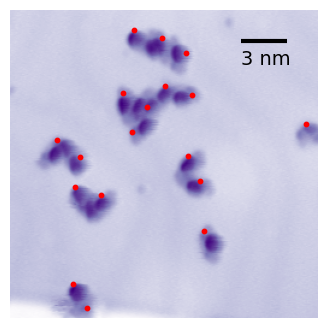

In [18]:
plt.figure(figsize=(4,  4))
points=img_prop_large.select_points(plot_graph=False)
for point in points:
    plt.scatter(point[0], point[1], c='r', s=10)
plt.imshow(img_large, extent=[-10, 10, 20, 0], cmap='Purples')
plt.axis('off')
plt.hlines(2, 5, 8, colors='k', linewidth=3)
plt.text(5, 3.6, '3 nm', fontsize=14, color='k')

# Detect area

Text(4.8, 18.3, '4 nm')

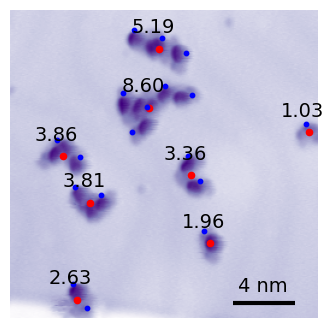

In [19]:
plt.figure(figsize=(4,  4))
img_prop_large.detect_contours()
for i in range(len(img_prop_large.contours)):
    img_prop_large.plot_contour(img_prop_large.contours[i], text=True, only_area=True)
for point in points:
    plt.scatter(point[0], point[1], c='blue', s=10)

plt.imshow(img_large, extent=[-10,10,20,0], cmap='Purples')
# plt.xticks([])
# plt.yticks([])
plt.axis('off')
plt.hlines(19, 4.5, 8.5, colors='k', linewidth=3)
plt.text(4.8, 18.3, '4 nm', fontsize=14, color='k')

# Detect 3.5 nm scanning images

## Expert labeling

In [2]:
typical_list_11_14_20_59=['2_2', '5_0', '9_5','20_2', '21_0', '27_6', '38_9', '49_0', '50_3', '76_7', '85_0', '88_0', '102_0', '113_0']
typical_list_11_26_6_24=['39_2', '41_1', '42_0','47_0', '46_2', '44_0', '46_0', '62_1', '63_0', '64_0', '73_5', '78_1', '80_0', '89_1', '96_1', '98_0', '103_2', '106_1', '113_1', '114_3', '116_0', '124_1', '94_0', '20_2', '23_1', '27_7', '28_0', '38_6', '50_4', '55_1', '61_1', '6_0']
typical_list_12_1_3_26=['3_8', '9_0', '16_0', '28_4', '36_1', '53_0', '60_0', '93_1', '95_9', '102_0', '103_0', '122_0']
typical_list_12_5_15_15=['10_0', '14_0', '26_6','71_0', '78_0', '97_0', '98_0', '102_0', '105_0', '108_0', '122_0', '123_1', '137_5', '139_0', '147_0', '152_0']


rotation_list_11_14_20_59=['0_9', '27_4', '42_1','46_0', '51_1', '56_1', '62_0', '77_0', '87_1']
rotation_list_11_26_6_24=['29_9', '31_0', '35_0','36_0', '38_0', '48_0', '56_0', '56_2', '56_4', '60_1', '68_0', '69_2', '70_0', '74_1', '81_0', '82_0', '83_0', '86_4', '93_1', '108_1', '111_2', '112_1', '112_2', '120_0', '121_0', '124_0']
rotation_list_12_1_3_26=['2_3', '6_1', '7_0', '7_4', '8_0', '10_1', '10_2', '10_3', '15_1', '33_0', '33_1', '37_0', '51_4', '52_0', '57_1', '58_0', '105_2', '113_1']
rotation_list_12_5_15_15=['12_4', '13_0', '15_6','16_0', '27_0', '42_1', '47_3', '49_1', '56_0', '69_0', '70_0', '73_0', '87_0', '93_1', '103_0', '113_0', '120_0', '124_0', '151_3']


# succ_list_11_14_20_59=['7_1', '11_0', '12_1','18_2', '25_0', '26_3', '29_1', '31_1', '32_9', '33_2', '40_0', '48_2', '87_3', '91_0', '111_0']
# succ_list_11_26_6_24=['7_8', '9_0', '12_0','14_2', '21_2', '27_5', '32_0', '35_3', '36_2', '49_0', '51_0', '53_4', '54_4', '57_0', '65_0', '66_0', '68_5', '70_1', '72_2', '75_0', '79_0', '81_1', '83_1', '84_1', '86_9', '91_5', '95_2', '101_1', '102_3', '104_1', '115_0', '119_2', '127_0', '128_1', '130_1', '131_2']
# succ_list_12_1_3_26=['5_0', '10_4', '11_5','12_1', '13_0', '14_0', '25_1', '29_0', '37_1', '38_1', '39_1', '43_4', '44_2', '45_9', '55_1', '58_1', '69_0', '75_1', '78_2', '85_2', '86_0', '91_0', '97_3', '98_1', '106_0', '109_0', '116_0', '121_1']
# succ_list_12_5_15_15=['2_0', '9_0', '22_2','23_5', '24_0', '29_0', '41_2', '51_1', '54_1', '57_0', '58_2', '68_0', '72_0', '76_3', '77_3', '88_0', '90_0', '94_6', '104_3', '114_4', '134_1', '143_0', '154_0', '163_0']

# Strict successful cases
succ_list_11_14_20_59=['7_1', '11_0', '18_2', '26_3', '29_1', '31_1', '33_2', '111_0']
succ_list_11_26_6_24=['7_8', '9_0', '21_2', '49_0', '51_0', '53_4', '57_0', '72_2', '75_0', '81_1', '83_1', '86_9', '91_5', '95_2', '115_0', '127_0', '128_1', '131_2']
succ_list_12_1_3_26=['5_0', '12_1', '13_0', '14_0', '29_0', '37_1', '39_1', '43_4', '69_0', '78_2', '85_2', '86_0', '98_1', '106_0', '109_0', '116_0', '121_1']
succ_list_12_5_15_15=['2_0', '23_5', '29_0', '51_1', '58_2', '68_0', '72_0', '76_3', '77_3', '88_0', '104_3', '134_1', '163_0']


## Draw all cases (successful and unsuccessful (rotation and messy))

209
succ_label: 209


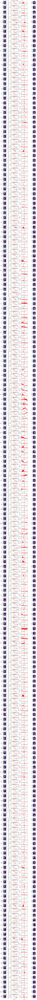

In [3]:
succ=0
succ_label=0
total_mols=450
plt.figure(figsize=(11, 650))
area_before=[]
area_after=[]
ellipse_prop=[]
diff_topographys=[]
rotation_dataset=[]
succ_diss_dataset=[]
typical_dataset=[]
rotation_curr_dataset=[]
succ_diss_curr_dataset=[]
typical_curr_dataset=[]
all_tip_pos=[]
mol_center_x_nm_before=[]
mol_center_y_nm_before=[]
all_tip_pos=[]
all_diss_data=[]
current_time_all=[]
select_mode='succ'      # typical, succ, rotation
if select_mode=='rotation':
    current_time_list_all=['4_10_22_57', '4_13_14_41', '4_19_19_44', '5_2_15_5', '11_14_20_59', '11_26_6_24', '12_1_3_26', '12_5_15_15']
    current_time_list=[current_time_list_all[0]]
    # current_time_list=current_time_list_all[3:5]
else:
    current_time_list=['4_10_22_57', '4_13_14_41', '4_19_19_44', '5_2_15_5', '11_14_20_59', '11_26_6_24', '12_1_3_26', '12_5_15_15']
current_time_list_1=['11_14_20_59', '11_26_6_24', '12_1_3_26', '12_5_15_15']
all_succ_list=[]


if not os.path.exists('diss_%s_before' % select_mode):
    os.mkdir('diss_%s_before'  % select_mode)
    os.mkdir('diss_%s_after'  % select_mode)


for current_time in current_time_list:
    file_path='diss_all_output/save_diss_image_all_sac_%s' % current_time

    diss_before_img=os.path.join(file_path, 'diss_before_img')
    diss_after_img=os.path.join(file_path, 'diss_after_img')
    diss_before_data=os.path.join(file_path, 'diss_before_data')
    diss_after_data=os.path.join(file_path, 'diss_after_data')
    diss_data=os.path.join(file_path, 'diss_data')
    diss_tip_pos=os.path.join(file_path, 'diss_tip_pos')
    if current_time in current_time_list_1:
        if select_mode=='succ':
            succ_list=globals()['succ_list_'+current_time]
        elif select_mode=='typical':
            succ_list=globals()['typical_list_'+current_time]
        elif select_mode=='rotation':
            succ_list=globals()['rotation_list_'+current_time]
    else:
        if select_mode=='succ':
            all_list=pd.read_csv('%s/all_tip_pos_data_label_%s-sure.txt' % (file_path, current_time), delimiter='\t', skipinitialspace=True)
        else:
            all_list=pd.read_csv('%s/all_tip_pos_data_label_%s.txt' % (file_path, current_time), delimiter='\t', skipinitialspace=True)
        all_list.rename(columns=lambda x: x.strip(), inplace=True)
        all_list['done_diss']=all_list['done_diss'].str.strip()
        # succ_list_all=all_list[all_list['done_diss']=='True'].reset_index(drop=True)
        if select_mode=='succ':
            succ_list_all=all_list[all_list['expert']==1].reset_index(drop=True)
        elif select_mode=='typical':
            succ_list_all=all_list[all_list['expert']==3].reset_index(drop=True)
        elif select_mode=='rotation':
            succ_list_all=all_list[all_list['expert']==2].reset_index(drop=True)
        succ_list=[str(succ_list_all['episode_i'][i])+'_'+str(succ_list_all['diss_i'][i]) for i in range(len(succ_list_all))]

    if select_mode=='typical':
        for item in ['4_0', '32_0', '74_3', '79_2', '126_7', '9_1', '30_0', '47_1' ]:
            if item in succ_list:
                succ_list.remove(item)

    all_succ_list.append(succ_list)
    
    # all_tip_pos=[]
    # all_diss_data=[]
    # current_time_all=[]
    model='sac'
    save_succ_path_before='diss_'+select_mode+'_before/'+model+'_succ_'+current_time
    save_succ_path_after='diss_'+select_mode+'_after/'+model+'_succ_'+current_time
    # save_succ_path=model+'_rotation_'+current_time
    # save_succ_path=model+'_typical_'+current_time


    if not os.path.exists(save_succ_path_before):
        os.mkdir(save_succ_path_before)

    if not os.path.exists(save_succ_path_after):
        os.mkdir(save_succ_path_after)

    # succ_list=globals()['succ_list_'+current_time]
    # succ_list=globals()['rotation_list_'+current_time]
    # succ_list=globals()['typical_list_'+current_time]
    episodes=200
    diss_maxtime=20

    
    column_num=4

    for episode_i in range(0, episodes):  #(episodes):
        for diss_i in range(diss_maxtime):
            # if os.path.exists('%s/diss_before_%d_%d.png' % (diss_before_img, episode_i, diss_i)) and '%d_%d' % (episode_i, diss_i) in succ_list:
            if select_mode=='rotation' and current_time=='4_10_22_57' and episode_i in [31, 46, 49, 50, 63, 110, 111, 133, 136, 141, 146, 149, 150, 152, 153]:
                break
            if select_mode=='rotation' and current_time=='4_13_14_41' and episode_i in [1, 6, 26, 32, 44, 53, 70, 74, 76, 81, 100]:
                break
            if select_mode=='rotation' and current_time=='4_19_19_44' and episode_i in [2, 4, 22, 24, 27, 32, 45, 47, 59, 134, 135]:
                break
            if select_mode=='rotation' and current_time=='5_2_15_5' and episode_i in [128, 149]:
                break
            if select_mode=='rotation' and current_time=='11_14_20_59' and episode_i in [4, 10, 16, 19, 20, 23, 30, 31, 35, 38, 39, 43, 49, 56, 59, 61, 62, 64, 71, 72, 78, 81, 82, 83, 90,  92, 94,  95, 99, 103, 104, 107, 116]:
                break
            if select_mode=='rotation' and current_time=='11_26_6_24' and episode_i in [2, 3, 10, 11, 35, 45, 46, 69, 72, 76, 83, 101, 102, 104, 107, 114, 131]:
                break
            if select_mode=='rotation' and current_time=='12_1_3_26' and episode_i in [4, 13, 14, 20, 26, 31, 49, 58, 59, 64, 75, 93, 101, 109, 111, 112, 120, 124]:
                break
            if select_mode=='rotation' and current_time=='12_5_15_15' and episode_i in [1, 5, 7, 8, 20, 22, 23, 30, 33, 35, 36, 37, 41, 46, 55, 72, 74, 75, 80, 82, 84, 86, 88, 89, 92, 99, 106, 107, 108, 115, 118, 121, 128, 130, 132, 134, 145, 150, 157, 158, 159, 167]:
                break

            # if os.path.exists('%s/diss_before_%d_%d.png' % (diss_before_img, episode_i, diss_i)) and os.path.exists('%s/diss_before_%d_%d.png' % (diss_before_img, episode_i, diss_i+1)):

            if os.path.exists('%s/diss_before_%d_%d.png' % (diss_before_img, episode_i, diss_i)) and '%d_%d' % (episode_i, diss_i) in succ_list:    
                plt.subplot(total_mols, column_num, (succ)*column_num+1)
                img=cv2.imread('%s/diss_before_%d_%d.png' % (diss_before_img, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
                with open('%s/scan_data_%d_%d.pkl' % (diss_before_data, episode_i, diss_i), 'rb') as f:
                    scan_data_before = pickle.load(f)
                img_prop_small=mol_property(img, offset_x_nm=scan_data_before.offset_nm[0], offset_y_nm=scan_data_before.offset_nm[1], len_nm=scan_data_before.len_nm[0])
                img_prop_small.center_points_from_contour(plot_graph=False)
                img_prop_small.contour_property()
                mol_center_x_nm=img_prop_small.ellipse_x
                mol_center_y_nm=img_prop_small.ellipse_y

                mol_center_x_nm_before.append(mol_center_x_nm)
                mol_center_y_nm_before.append(mol_center_y_nm) 

                with open('%s/vert_tip_pos_%d_%d.pkl' % (diss_tip_pos, episode_i, diss_i), 'rb') as f:
                        vert_tip_pos = pickle.load(f)
                plt.scatter([vert_tip_pos[3]], [vert_tip_pos[4]], color='r')
                plt.imshow(img, extent=[scan_data_before.offset_nm[0]-scan_data_before.len_nm[0]/2,  scan_data_before.offset_nm[0]+scan_data_before.len_nm[0]/2, scan_data_before.offset_nm[1]+scan_data_before.len_nm[1], scan_data_before.offset_nm[1]])
                plt.title('%.2f_%.2f' % (img_prop_small.area, img_prop_small.ellipse_angle))
                area_before.append(img_prop_small.area)
                ellipse_prop.append([img_prop_small.ellipse_height, img_prop_small.ellipse_width, img_prop_small.ellipse_angle])
                plt.ylabel(succ_label, fontsize=14)

                shutil.copyfile('%s/diss_before_%d_%d.png' % (diss_before_img, episode_i, diss_i), '%s/diss_before_%d_%d.png' % (save_succ_path_before,  episode_i, diss_i))

                plt.subplot(total_mols, column_num, succ*column_num+2)
                if os.path.exists('%s/vert_data_%d_%d.pkl' % (diss_data, episode_i, diss_i)):
                    with open('%s/vert_data_%d_%d.pkl' % (diss_data, episode_i, diss_i), 'rb') as f:
                        vert_data = pickle.load(f)
                    with open('%s/vert_tip_pos_%d_%d.pkl' % (diss_tip_pos, episode_i, diss_i), 'rb') as f:
                        vert_tip_pos = pickle.load(f)
                    plt.plot(vert_data.V, vert_data.topography, c='r')
                    plt.scatter(vert_data.V[0], vert_data.topography[0], s=100, color='yellow')
                    
                    # if vert_tip_pos[7]:
                    #     plt.plot(vert_data.V, vert_data.topography, c='r')
                    # else:
                    #     plt.plot(vert_data.V, vert_data.topography)
                    if current_time in current_time_list_1:
                        vert_tip_pos.append(' ')
                    all_tip_pos.append(vert_tip_pos)

                    all_diss_data.append(vert_data)
                    current_time_all.append(current_time)
                    topography=np.array(vert_data.topography)
                    diff_topography=np.abs(topography[0:512].sum()-topography[512:].sum())
                    diff_topographys.append(diff_topography)
                    # plt.title('%d_%d_%.2f_%.2f_%.2f_%s' % (episode_i, diss_i, diff_topography, vert_tip_pos[5], vert_tip_pos[6], vert_tip_pos[7]))
                    plt.title('%d_%d_%.2f_%.2f' % (episode_i, diss_i, vert_tip_pos[5], vert_tip_pos[6]))
                    plt.xlim(0, 3.8)
                    plt.xticks([i for i in range(0,4)])
                    plt.xlabel('Bias (V)')
                    plt.ylabel('Topography (nm)')

                plt.subplot(total_mols, column_num, succ*column_num+3)
                if os.path.exists('%s/vert_data_%d_%d.pkl' % (diss_data, episode_i, diss_i)):
                    with open('%s/vert_data_%d_%d.pkl' % (diss_data, episode_i, diss_i), 'rb') as f:
                        vert_data = pickle.load(f)
                    with open('%s/vert_tip_pos_%d_%d.pkl' % (diss_tip_pos, episode_i, diss_i), 'rb') as f:
                        vert_tip_pos = pickle.load(f)
                    plt.plot(vert_data.time, vert_data.current, c='r')
                    # if vert_tip_pos[7]:
                    #     plt.plot(vert_data.time, vert_data.current, c='r')
                    # else:
                    #     plt.plot(vert_data.time, vert_data.current)
                    plt.xlabel('Time (s)')
                    plt.ylabel('Current (A)')
                
                plt.subplot(total_mols, column_num, (succ)*column_num+4)
                img=cv2.imread('%s/diss_after_%d_%d.png' % (diss_after_img, episode_i, diss_i), cv2.IMREAD_GRAYSCALE)
                with open('%s/scan_data_%d_%d.pkl' % (diss_after_data, episode_i, diss_i), 'rb') as f:
                    scan_data_after = pickle.load(f)
                img_prop_small=mol_property(img, offset_x_nm=scan_data_after.offset_nm[0], offset_y_nm=scan_data_after.offset_nm[1], len_nm=scan_data_after.len_nm[0])
                img_prop_small.center_points_from_contour(plot_graph=False)
                
                if select_mode!='typical':
                    img_prop_small.contour_property()
                    plt.title('%.2f' % img_prop_small.area)
                    area_after.append(img_prop_small.area)
                plt.scatter([vert_tip_pos[3]], [vert_tip_pos[4]], color='r')
                plt.imshow(img, extent=[scan_data_after.offset_nm[0]-scan_data_after.len_nm[0]/2,  scan_data_after.offset_nm[0]+scan_data_after.len_nm[0]/2, scan_data_after.offset_nm[1]+scan_data_after.len_nm[1], scan_data_after.offset_nm[1]])
                succ=succ+1
                succ_label=succ_label+1
                
                shutil.copyfile('%s/diss_after_%d_%d.png' % (diss_after_img, episode_i, diss_i), '%s/diss_after_%d_%d.png' % (save_succ_path_after,  episode_i, diss_i))
                # succ_diss_dataset.append(np.array(vert_data.topography)) 
                # succ_diss_curr_dataset.append(np.array(vert_data.current))   
                # rotation_dataset.append(np.array(vert_data.topography))
                # rotation_curr_dataset.append(np.array(vert_data.current)) 
                typical_dataset.append(np.array(vert_data.topography))
                typical_curr_dataset.append(np.array(vert_data.current))   
                   


# if current_time in current_time_list_1:
#     all_tip_pos_data_diss=pd.DataFrame(all_tip_pos, columns=['label', 'mol_center_x_nm', 'mol_center_y_nm', 'diss_x_nm', 'diss_y_nm', 'diss_mvoltage', 'diss_pcurrent', 'done_diss'])
# else:
#     all_tip_pos_data_diss=pd.DataFrame(all_tip_pos, columns=['label', 'mol_center_x_nm', 'mol_center_y_nm', 'diss_x_nm', 'diss_y_nm', 'diss_mvoltage', 'diss_pcurrent', 'done_diss', 'action'])
all_tip_pos_data_diss=pd.DataFrame(all_tip_pos, columns=['label', 'mol_center_x_nm', 'mol_center_y_nm', 'diss_x_nm', 'diss_y_nm', 'diss_mvoltage', 'diss_pcurrent', 'done_diss', 'action'])
all_tip_pos_data_diss['relative_diss_x']=all_tip_pos_data_diss['diss_x_nm']-all_tip_pos_data_diss['mol_center_x_nm']
all_tip_pos_data_diss['relative_diss_y']=all_tip_pos_data_diss['diss_y_nm']-all_tip_pos_data_diss['mol_center_y_nm']

all_tip_pos_data_diss['mol_x_before']=mol_center_x_nm_before
all_tip_pos_data_diss['mol_y_before']=mol_center_y_nm_before

all_tip_pos_data_diss['relative_diss_x_before']=all_tip_pos_data_diss['diss_x_nm']-all_tip_pos_data_diss['mol_x_before']
all_tip_pos_data_diss['relative_diss_y_before']=all_tip_pos_data_diss['diss_y_nm']-all_tip_pos_data_diss['mol_y_before']
all_tip_pos_data_diss['current_time']=current_time_all
print(len(all_tip_pos_data_diss))


# all_tip_pos_data_diss[['current_time', 'label', 'relative_diss_x_before', 'relative_diss_y_before', 'diss_mvoltage', 'diss_pcurrent']].to_csv('tip_pos_data_action_%s_%s_%s.csv' % (select_mode, current_time, succ))
# all_tip_pos_data_diss.to_csv('tip_pos_data_%s_%s_%s.csv' % (select_mode, current_time, succ))

plt.subplots_adjust(wspace=0.5, hspace=0.8)
print('succ_label:', succ_label)
plt.savefig('vertmani_new_expert_%s_%s_%s.pdf' % (select_mode, current_time, succ))
# with open('typical_dataset.pkl', 'wb') as file:
#     # Serialize and write the variable to the file
#     pickle.dump(typical_dataset, file)
# with open('typical_curr_dataset.pkl', 'wb') as file:
#     # Serialize and write the variable to the file
#     pickle.dump(typical_curr_dataset, file)

## Molecular properties (area, ellipse height, ellipse width, ellipse angle)

specific_angle: 133 5.29 79_11 5_2_15_5
specific_angle: 63 44.89 9_2 4_19_19_44
specific_angle: 46 89.93 43_0 4_13_14_41
specific_angle: 71 130.31 39_2 4_19_19_44
specific_angle: 27 172.27 119_2 4_10_22_57


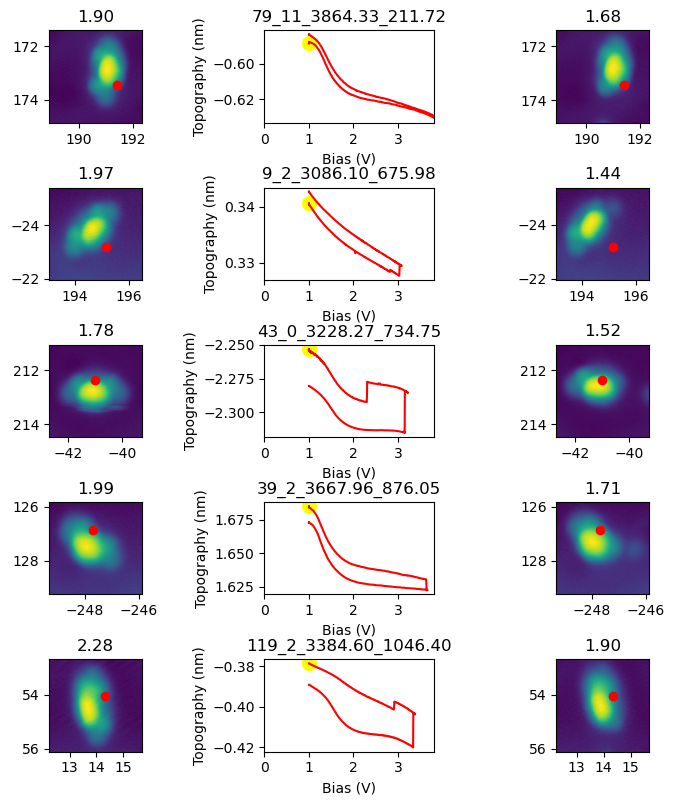

In [5]:
ell_height=[i[0] for i in ellipse_prop]
ell_width=[i[1] for i in ellipse_prop]
ell_angle=[i[2] for i in ellipse_prop]
dict_ellipse={'ell_height': ell_height, 'ell_width': ell_width, 'ell_angle': ell_angle}
ell_data=pd.DataFrame(dict_ellipse)

num_plots=5
plt.figure(figsize=(12,40))
for num, specific_angle in enumerate([0, 45, 90, 135, 180]):
    number=ell_data['ell_angle'].apply(lambda x: (x-specific_angle)).abs().argmin()
    print('specific_angle:', number, ell_data['ell_angle'][number], all_tip_pos_data_diss['label'][number], all_tip_pos_data_diss['current_time'][number])
    episode_i=int(all_tip_pos_data_diss['label'][number].split('_')[0])
    diss_i=int(all_tip_pos_data_diss['label'][number].split('_')[1])
    current_time=all_tip_pos_data_diss['current_time'][number]


    draw_diss_examp(episode_i, diss_i, current_time=current_time, succ=num+1)

plt.subplots_adjust(wspace=0.5, hspace=0.7)

In [158]:
draw_diss_examp(13, 0, current_time='12_5_15_15', succ=num+1)   # 0.58
draw_diss_examp(12, 1, current_time='12_1_3_26', succ=num+1)   # 1.03
draw_diss_examp(74, 0, current_time='11_26_6_24', succ=num+1)  # 2.33
draw_diss_examp(22, 1, current_time='4_10_22_57', succ=num+1)   # 179.12
draw_diss_examp(85, 1, current_time='12_1_3_26', succ=num+1)   # 89.81
draw_diss_examp(137, 4, current_time='12_5_15_15', succ=num+1)   # 90.83
draw_diss_examp(36, 1, current_time='4_10_22_57', succ=num+1)  # 44.49
draw_diss_examp(27, 3, current_time='11_14_20_59', succ=num+1)  # 137.24
# draw_diss_examp(154, 4, current_time='4_10_22_57', succ=num+1)  # 142.14
# draw_diss_examp(79, 7, current_time='5_2_15_5', succ=num+1)   # 4.89


# Five typical angle of molecules

Text(0.3, 3.15, '0.58°')

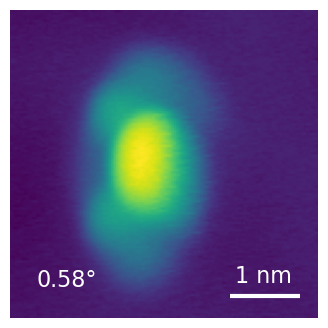

In [182]:
draw_small_mol_examp(13, 0, current_time='12_5_15_15')
plt.text(0.3, 3.15, '0.58°', fontsize=16, color='w')

draw_small_mol_examp(36, 1, current_time='4_10_22_57')
plt.text(0.3, 3.15, '44.49°', fontsize=16, color='w')


draw_small_mol_examp(137, 4, current_time='12_5_15_15')
plt.text(0.3, 3.15, '90.83°', fontsize=16, color='w')

draw_small_mol_examp(27, 3, current_time='11_14_20_59')
plt.text(0.3, 3.15, '137.24°', fontsize=16, color='w')

draw_small_mol_examp(22, 1, current_time='4_10_22_57')
plt.text(0.3, 3.15, '179.12°', fontsize=16, color='w')

# Distribution of the angle of the ellipse

Text(0.5, 0, 'Angle of molecules')

<Figure size 300x300 with 0 Axes>

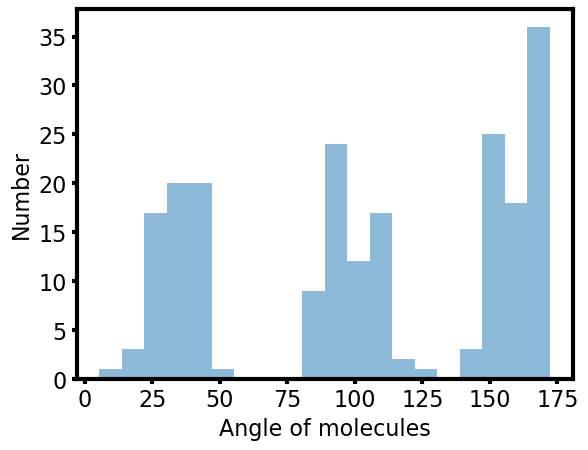

In [14]:
plt.figure(figsize=(3, 3))
fig, ax = plt.subplots()
plt.setp(ax.spines.values(), linewidth=3)
# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)
# plt.subplot(1, 3, 1)
# plt.hist(ell_height, bins=20, alpha=0.5, label='Height')
# plt.hist(ell_width, bins=20, alpha=0.5, label='Width')
plt.hist(np.array(ell_angle), bins=20, alpha=0.5, label='Angle')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel('Number', fontsize=16)
plt.xlabel('Angle of molecules', fontsize=16)

# Distribution of the height and weight of molecules

Text(0.5, 0, 'Height (width) of molecules')

<Figure size 300x300 with 0 Axes>

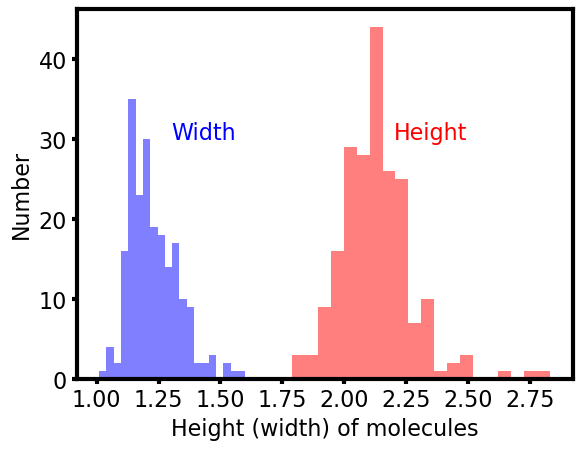

In [22]:
plt.figure(figsize=(3, 3))

fig, ax = plt.subplots()


plt.setp(ax.spines.values(), linewidth=3)

# The ticks
ax.xaxis.set_tick_params(width=3)
ax.yaxis.set_tick_params(width=3)
# plt.subplot(1, 3, 1)
plt.hist(ell_height, bins=20, alpha=0.5, label='Height', color='r')
plt.hist(ell_width, bins=20, alpha=0.5, label='Width', color='b')
# plt.hist(np.array(ell_angle), bins=20, alpha=0.5, label='Angle')
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)
plt.ylabel('Number', fontsize=16)
plt.text(2.2, 30, 'Height', fontsize=16, color='r')
plt.text(1.3, 30, 'Width', fontsize=16, color='b')
plt.xlabel('Height (width) of molecules', fontsize=16)